In [ ]:
from PIL import Image
from skimage import img_as_float, img_as_ubyte
from skimage.color import rgb2gray
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import ORB, match_descriptors
from skimage.transform import ProjectiveTransform, warp
from skimage.measure import ransac
import imageio

from google.colab import drive
drive.mount('/content/gdrive/')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


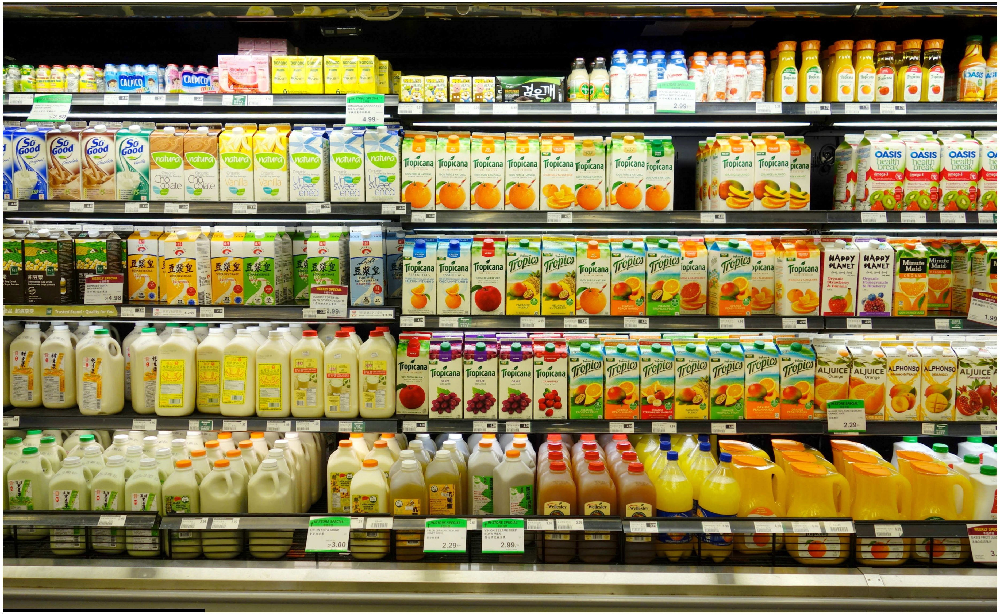

In [ ]:
# Функция для чтения изображения с использованием PIL
def read_image(filepath):
    image = Image.open(filepath)
    return img_as_float(image.convert('RGB'))

# Загрузка и чтение изображений
image1 = read_image('/content/gdrive/MyDrive/images/1111.jpg')
image2 = read_image('/content/gdrive/MyDrive/images/1112.jpg')
image3 = read_image('/content/gdrive/MyDrive/images/1113.jpg')
image4 = read_image('/content/gdrive/MyDrive/images/1114.jpg')

# Преобразование изображений в черно-белый формат
image1_gray = rgb2gray(image1)
image2_gray = rgb2gray(image2)
image3_gray = rgb2gray(image3)
image4_gray = rgb2gray(image4)

# ORB детектор для ключевых точек
descriptor_extractor = ORB(n_keypoints=1000)

def find_keypoints_and_descriptors(image_gray):
    descriptor_extractor.detect_and_extract(image_gray)
    keypoints = descriptor_extractor.keypoints
    descriptors = descriptor_extractor.descriptors
    if descriptors is None:
        raise ValueError('No descriptors found in the image.')
    return keypoints, descriptors

# Найти ключевые точки и дескрипторы
keypoints1, descriptors1 = find_keypoints_and_descriptors(image1_gray)
keypoints2, descriptors2 = find_keypoints_and_descriptors(image2_gray)
keypoints3, descriptors3 = find_keypoints_and_descriptors(image3_gray)
keypoints4, descriptors4 = find_keypoints_and_descriptors(image4_gray)

# Найти соответствия с помощью match_descriptors
matches1_2 = match_descriptors(descriptors1, descriptors2, cross_check=True)
matches2_3 = match_descriptors(descriptors2, descriptors3, cross_check=True)
matches3_4 = match_descriptors(descriptors3, descriptors4, cross_check=True)

# Извлечение координат соответствующих точек
points1 = keypoints1[matches1_2[:, 0]][:, ::-1]
points2 = keypoints2[matches1_2[:, 1]][:, ::-1]
points2_3 = keypoints2[matches2_3[:, 0]][:, ::-1]
points3 = keypoints3[matches2_3[:, 1]][:, ::-1]
points3_4 = keypoints3[matches3_4[:, 0]][:, ::-1]
points4 = keypoints4[matches3_4[:, 1]][:, ::-1]

# Найти гомографию
model_robust_12, inliers = ransac((points2, points1), ProjectiveTransform, min_samples=4, residual_threshold=1, max_trials=3000)
model_robust_23, inliers = ransac((points3, points2_3), ProjectiveTransform, min_samples=4, residual_threshold=1, max_trials=3000)
model_robust_34, inliers = ransac((points4, points3_4), ProjectiveTransform, min_samples=4, residual_threshold=1, max_trials=3000)

# Размеры изображений
r1, c1 = image1.shape[:2]
r2, c2 = image2.shape[:2]
r3, c3 = image3.shape[:2]
r4, c4 = image4.shape[:2]

# Создаем выходное изображение так, чтобы оно могло вместить все изображения по ширине
output_shape_12 = (max(r1, r2), c1 + c2)
output_shape_23 = (max(output_shape_12[0], r3), output_shape_12[1] + c3)
output_shape_34 = (max(output_shape_23[0], r4), output_shape_23[1] + c4)

# Сшивка изображений 1 и 2
image1_warped = warp(image1, np.identity(3), output_shape=output_shape_12)
image2_warped = warp(image2, model_robust_12.inverse, output_shape=output_shape_12)

# Соединение изображений 1 и 2
result_image1_2 = np.maximum(image1_warped, image2_warped)

# Переход гомографии для третьего изображения
model_robust_23 = ProjectiveTransform(np.dot(model_robust_23.params, model_robust_12.params))

# Сшивка результирующего изображения с третьим изображением
result_image1_2_warped = warp(result_image1_2, np.identity(3), output_shape=output_shape_23)
image3_warped = warp(image3, model_robust_23.inverse, output_shape=output_shape_23)

# Соединение результатов
result_image1_2_3 = np.maximum(result_image1_2_warped, image3_warped)

# Переход гомографии для четвертого изображения
model_robust_34 = ProjectiveTransform(np.dot(model_robust_34.params, model_robust_23.params))

# Сшивка результирующего изображения с четвертым изображением
result_image1_2_3_warped = warp(result_image1_2_3, np.identity(3), output_shape=output_shape_34)
image4_warped = warp(image4, model_robust_34.inverse, output_shape=output_shape_34)

# Соединение результатов
final_result = np.maximum(result_image1_2_3_warped, image4_warped)

# Нахождение границ серых полос по вертикали
sum_rows = np.sum(final_result, axis=2)
non_empty_rows = np.where(np.sum(sum_rows, axis=1) > 0)[0]
top, bottom = non_empty_rows[0], non_empty_rows[-1]

# Нахождение границ серых полос по горизонтали
non_empty_cols = np.where(np.sum(sum_rows, axis=0) > 0)[0]
left, right = non_empty_cols[0], non_empty_cols[-1]

# Обрезка результирующего изображения до области с серыми полосами
cropped_final_result = final_result[top:bottom, left:right]

# Отображение обрезанного изображения
plt.figure(figsize=(48, 36))
plt.imshow(cropped_final_result)
plt.axis('off')
plt.show()

# Преобразуем изображение к формату uint8 (8-битное) перед сохранением
cropped_final_result8 = img_as_ubyte(cropped_final_result)

# Сохраняем изображение с использованием imageio
imageio.imwrite('/content/gdrive/MyDrive/images/cropped_final_result.jpeg', cropped_final_result8)

# Сохраняем изображение с использованием PIL
cropped_final_result = Image.fromarray(cropped_final_result8)
cropped_final_result.save('/content/gdrive/MyDrive/images/cropped_final_result.jpeg')